In [13]:
import torch
from torch import nn, optim, autograd
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.utils as vutils
from dataclasses import dataclass
from helper_plotting import plot_multiple_training_losses
import time
import sys
import numpy as np
%matplotlib inline
torch.set_num_threads(1)
torch.manual_seed(1)


device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

if device == torch.device("cuda:0"):
  print('Everything looks good; continue')
else:
  # It is OK if you cannot connect to a GPU. In this case, training the model for
  # 2 epoch is sufficient to get full mark. (NOTE THAT 2 epoch takes approximately 1.5 hours to train for CPU)
  print('GPU is not detected. Make sure you have chosen the right runtime type')

Everything looks good; continue


In [2]:


@dataclass
class Hyperparameter:
    batchsize: int          = 128
    num_epochs: int         = 100
    latent_size: int        = 128
    n_critic: int           = 5
    critic_size: int        = 1024
    generator_size: int     = 1024
    critic_hidden_size: int = 1024
    gp_lambda: float        = 10.
    generator_lr:float      = 0.0002
    discriminator_lr:float  = 0.0002
    image_height:int = 28
    image_width:int =28
    color_channel = 1
        
hp = Hyperparameter()
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
                                
dataset  = torchvision.datasets.MNIST("mnist", download=True, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=hp.batchsize, num_workers=1, shuffle=True, drop_last=True, pin_memory=True)

In [3]:
# Checking the dataset
for images, labels in dataloader:  
    print('Image batch dimensions:', images.shape)
    print('Image label dimensions:', labels.shape)
    break

Image batch dimensions: torch.Size([128, 1, 28, 28])
Image label dimensions: torch.Size([128])


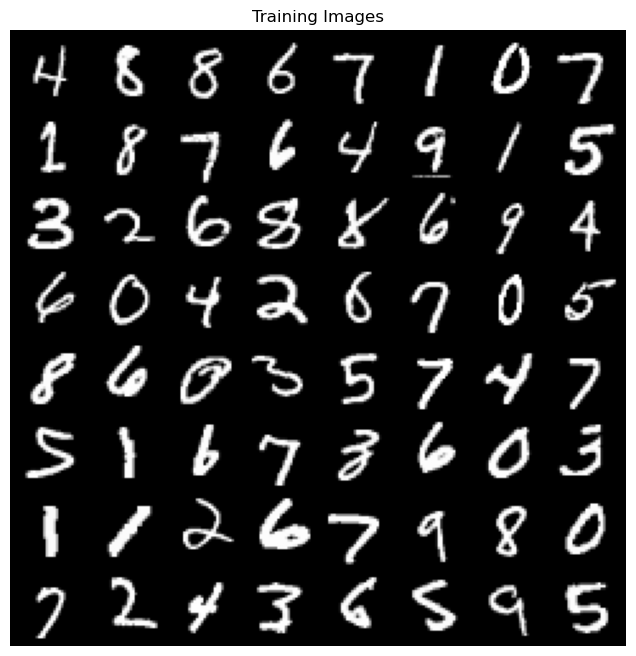

In [4]:

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(images[:64],padding=2,normalize=True),(1,2,0)))
plt.show()

In [5]:
# Define the generator

class GAN(nn.Module):
    def __init__(self):
        super( GAN, self).__init__()
        

        self.latent_embedding = nn.Sequential(nn.Linear(hp.latent_size , hp.generator_size ))
        self.generator = nn.Sequential(nn.Linear(hp.latent_size,128), 
                                       nn.LeakyReLU(inplace=True) , 
                                       nn.Dropout(p=0.5),
                                       nn.Linear(128,hp.image_height*hp.image_width*hp.color_channel),
                                       nn.Tanh()  # to have output in -1 to 1 range
                                       )
        
        self.discriminator = nn.Sequential( nn.Flatten() , 
                                           nn.Linear(hp.image_height*hp.image_width*hp.color_channel , 128),
                                           nn.LeakyReLU(inplace=True)  , 
                                           nn.Dropout(p=0.5) , 
                                           nn.Linear(128,1) , 
                                            )
        
    def generator_forward(self, latent): # latenct is NCHW
        z = torch.flatten(latent,start_dim=1) 
        #img_latent = self.latent_embedding(latent).reshape(-1, hp.generator_size, 1, 1)
        img =  self.generator(z)
        img = img.view(z.size(0) , hp.color_channel,hp.image_height, hp.image_width)
        return img
    
    def discriminator_forward(self, img)  : 
        logits = self.discriminator(img)
        return logits




In [6]:
model  = GAN()
model.to(device)
optim_gen = torch.optim.Adam(model.generator.parameters(), 
                             betas=(0.5,0.999) , 
                             lr = hp.generator_lr)

optim_disc = torch.optim.Adam(model.discriminator.parameters(), 
                              betas  = (0.5,0.99) ,
                              lr = hp.discriminator_lr)


In [20]:
import time
import torch
import torch.nn.functional as F
import torchvision
import torch.autograd

def train_gan_v1(num_epochs, model, optimizer_gen, optimizer_discr, 
                 latent_dim, device, train_loader, loss_fn=None,
                 logging_interval=100, 
                 save_model=None):
    
    log_dict = {'train_generator_loss_per_batch': [],
            'train_discriminator_loss_per_batch': [],
            'train_discriminator_real_acc_per_batch': [],
            'train_discriminator_fake_acc_per_batch': [],
            'images_from_noise_per_epoch': []}
    
    
    if loss_fn is None :
        loss_fn = F.binary_cross_entropy_with_logits
        
     
     
    fixed_noise  = torch.randn(64,latent_dim,1,1,device = device ) # format NCHW    
    start_time  = time.time()
    for epoch in range(num_epochs):
        model.train()
        for batch_idx,(features,_) in enumerate(train_loader):
            batch_size = features.size(0)
                  
            # real images
            real_images = features.to(device)
            real_labels = torch.ones(batch_size,device=device)          # label = 1
            
            
            # generated (fake) images
            noise = torch.randn(batch_size , latent_dim , 1, 1 , device = device)    #format NCHW
            fake_images = model.generator_forward(noise)
            fake_labels  =  torch.zeros(batch_size , device =  device ) # fake label = 0
            flipped_fake_image = real_labels # here fake label =1 
            
            
            
            #-------------------------------
            
            # Train Discriminator 
            
            #-------------------------------
            
            
            optimizer_discr.zero_grad()
            
            # get discreminator loss on real images
            
            discr_pred_real = model.discriminator_forward(real_images).view(-1)    #Nx1->N
            real_loss = loss_fn(discr_pred_real , real_labels)
            
            
            # discriminator loss on fake images 
            discr_pred_fake = model.discriminator_forward(fake_images.detach()).view(-1)
            fake_loss = loss_fn(discr_pred_fake  , fake_labels )           #binary loss
            
            
            
            # combined loss
            discr_loss = 0.5*(real_loss + fake_loss)
            discr_loss.backward()
            optimizer_discr.step()
            
            #----------------------------------
            
            # Train generator
            
            #---------------------------------
            
            
            optimizer_gen.zero_grad()
            
            # get discriminator loss on fake images with flipped labels
            
            dis_pred_fake =  model.discriminator_forward(fake_images).view(-1)
            genner_loss = loss_fn(dis_pred_fake , flipped_fake_image)
            genner_loss.backward()
            
            optimizer_gen.step()
            
            #--------------------
            
            # logging 
            
            #----------------------
            
            log_dict['train_generator_loss_per_batch'].append(genner_loss.item())
            log_dict['train_discriminator_loss_per_batch'].append(discr_loss.item())
            
            predicted_labels_real =  torch.where(discr_pred_real.detach()>0.,1.,0.0)
            predicted_labels_fake = torch.where(discr_pred_fake.detach()>0.0,1.0,0.0)
            
            acc_real = (predicted_labels_real == real_labels).float().mean()*100.
            acc_fake = (predicted_labels_fake == fake_labels).float().mean()*100.
            
            
            
            log_dict['train_discriminator_real_acc_per_batch'].append(acc_real.item())
            log_dict['train_discriminator_fake_acc_per_batch'].append(acc_fake.item())  
            
            
            if not batch_idx % logging_interval:
                print('Epoch: %03d/%03d | Batch %03d/%03d | Gen/Dis Loss: %.4f/%.4f' % (epoch+1, num_epochs, batch_idx, len(train_loader), genner_loss.item(), discr_loss.item()))
                print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))
                
            # save images for evaluation 
            
            with torch.no_grad():
                fake_images = model.generator_forward(fixed_noise).detach().cpu()
                log_dict['images_from_noise_per_epoch'].append(
                torchvision.utils.make_grid(fake_images, padding=2, normalize=True))
            
                
                
    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    if save_model is not None:
        torch.save(model.state_dict(), save_model)
        
    return log_dict

In [21]:

log_dict = train_gan_v1(num_epochs=100, model=model, 
                        optimizer_gen=optim_gen,
                        optimizer_discr=optim_disc,
                        latent_dim=128,
                        device=device, 
                        train_loader=dataloader,
                        logging_interval=100,
                        save_model='gan_mnist_01.pt')

Epoch: 001/100 | Batch 000/468 | Gen/Dis Loss: 1.2400/0.3891
Time elapsed: 0.00 min
Epoch: 001/100 | Batch 100/468 | Gen/Dis Loss: 1.0149/0.4836
Time elapsed: 0.03 min
Epoch: 001/100 | Batch 200/468 | Gen/Dis Loss: 1.0862/0.4249
Time elapsed: 0.05 min
Epoch: 001/100 | Batch 300/468 | Gen/Dis Loss: 1.2734/0.4702
Time elapsed: 0.08 min
Epoch: 001/100 | Batch 400/468 | Gen/Dis Loss: 1.2731/0.4313
Time elapsed: 0.10 min
Epoch: 002/100 | Batch 000/468 | Gen/Dis Loss: 1.0832/0.4529
Time elapsed: 0.12 min
Epoch: 002/100 | Batch 100/468 | Gen/Dis Loss: 1.1321/0.4823
Time elapsed: 0.15 min
Epoch: 002/100 | Batch 200/468 | Gen/Dis Loss: 1.0834/0.4785
Time elapsed: 0.17 min
Epoch: 002/100 | Batch 300/468 | Gen/Dis Loss: 1.1817/0.4377
Time elapsed: 0.20 min
Epoch: 002/100 | Batch 400/468 | Gen/Dis Loss: 1.1935/0.4431
Time elapsed: 0.22 min
Epoch: 003/100 | Batch 000/468 | Gen/Dis Loss: 1.2060/0.4909
Time elapsed: 0.24 min
Epoch: 003/100 | Batch 100/468 | Gen/Dis Loss: 1.2551/0.4823
Time elapsed: 0

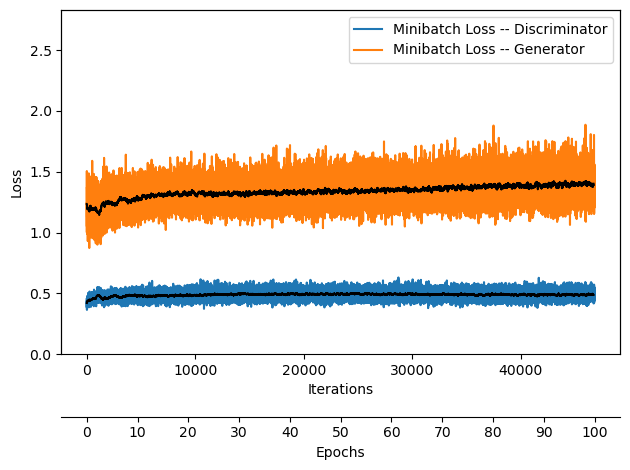

In [22]:
plot_multiple_training_losses(
    losses_list=(log_dict['train_discriminator_loss_per_batch'],
                 log_dict['train_generator_loss_per_batch']),
    num_epochs=100, 
    custom_labels_list=(' -- Discriminator', ' -- Generator')
)

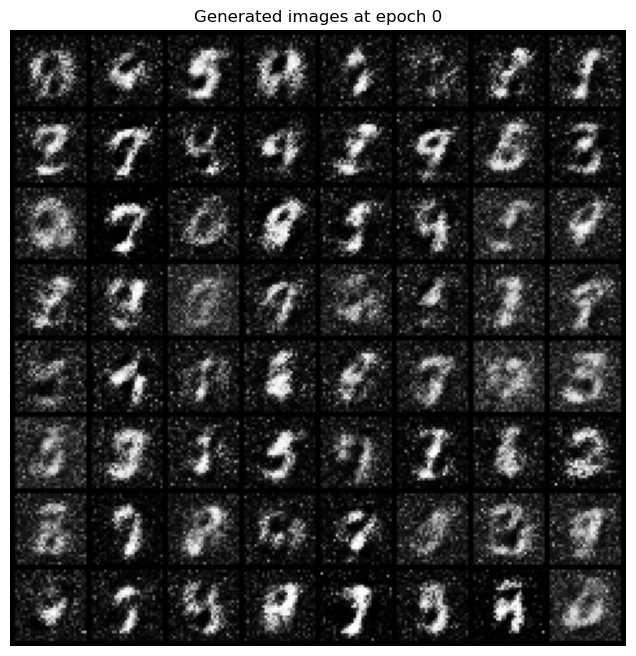

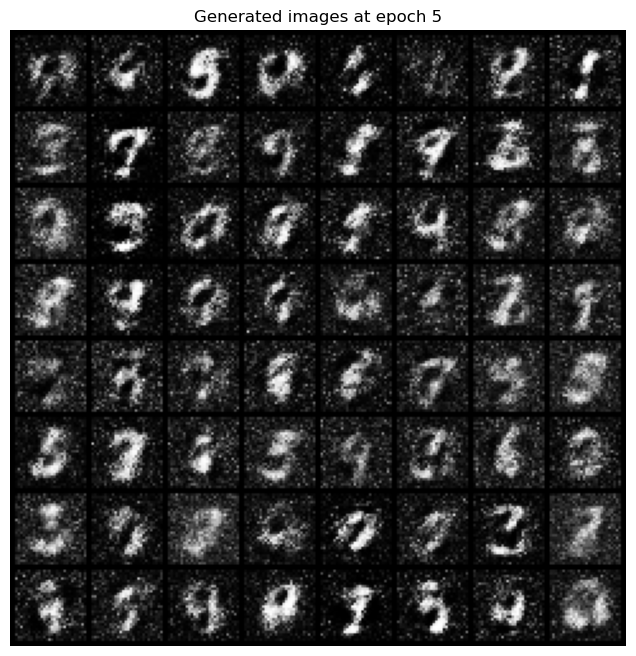

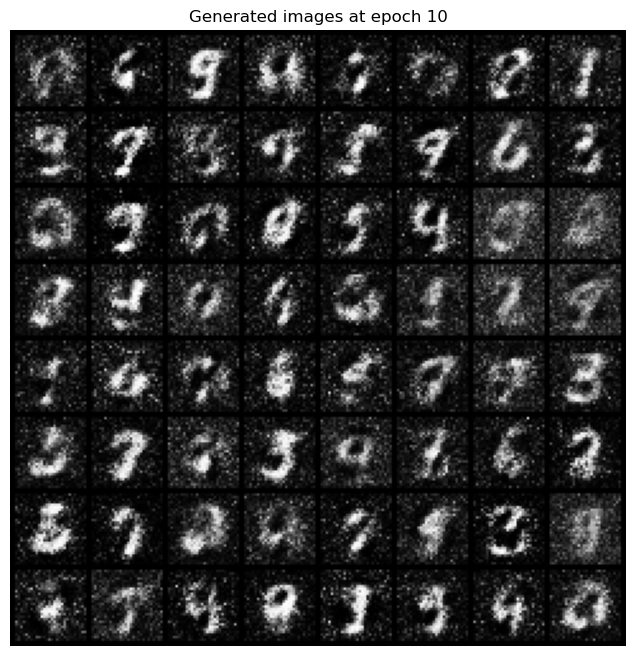

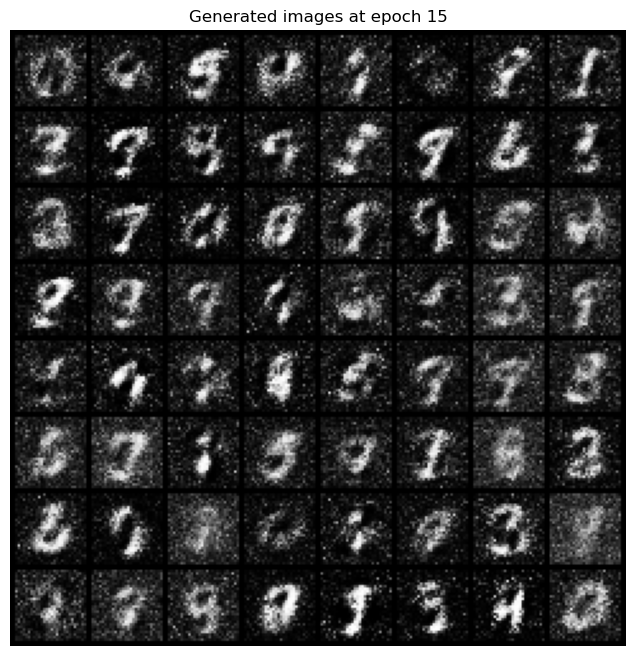

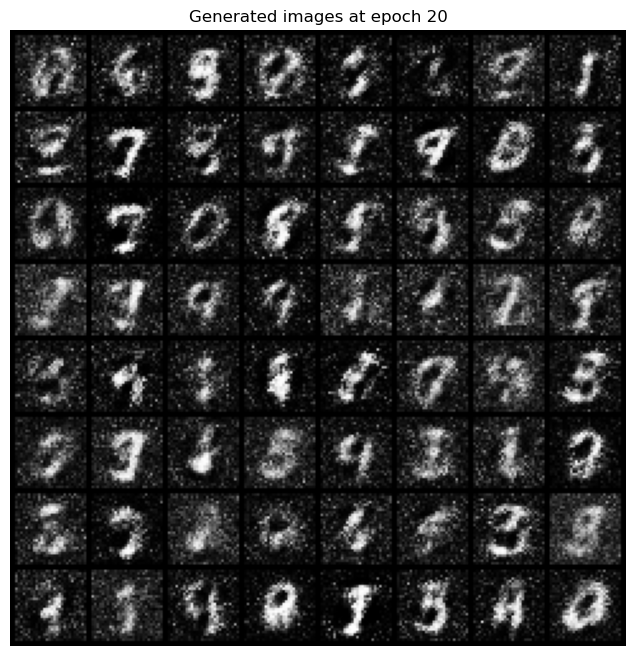

...

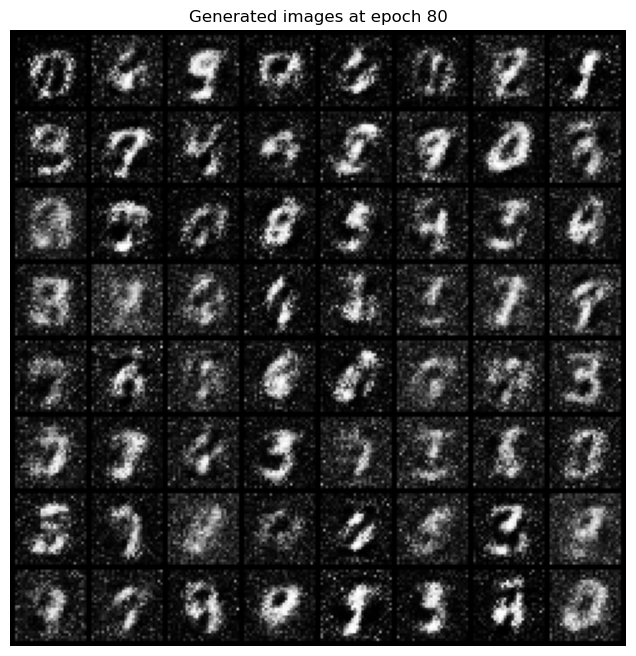

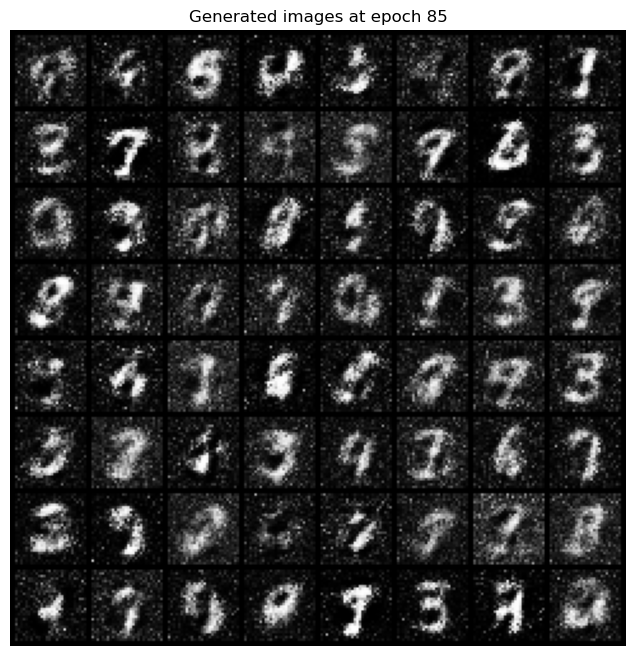

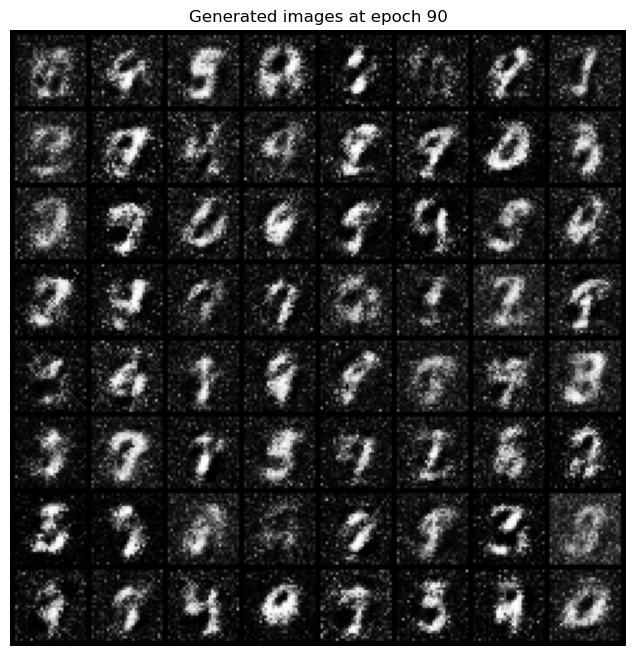

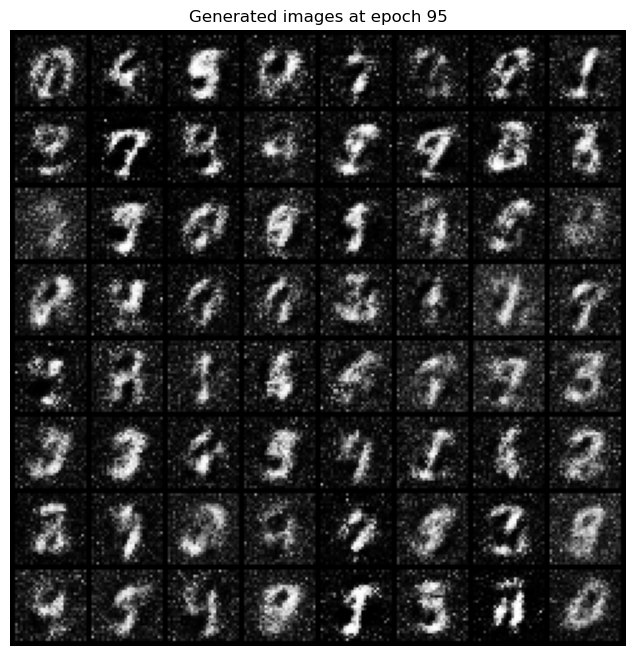

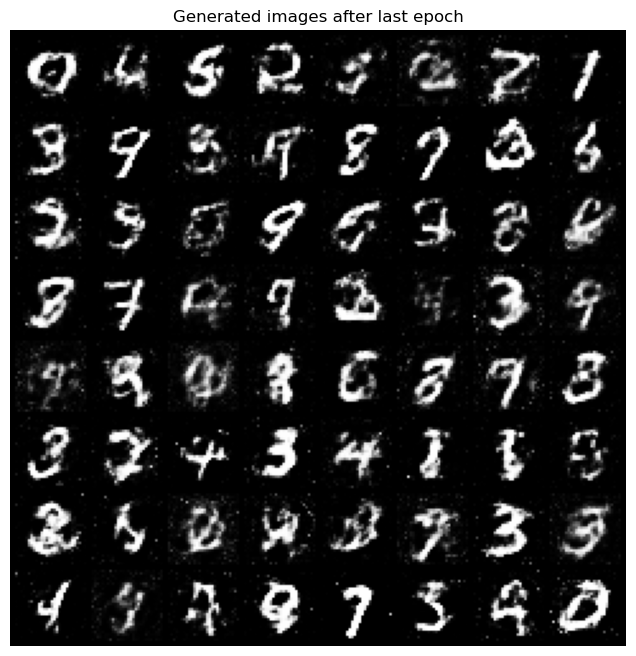

In [23]:
##########################
### VISUALIZATION
##########################

for i in range(0, 100, 5):
    
    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.title(f'Generated images at epoch {i}')
    plt.imshow(np.transpose(log_dict['images_from_noise_per_epoch'][i], (1, 2, 0)))
    plt.show()
    
    
plt.figure(figsize=(8, 8))
plt.axis('off')
plt.title(f'Generated images after last epoch')
plt.imshow(np.transpose(log_dict['images_from_noise_per_epoch'][-1], (1, 2, 0)))
plt.show()